# Machine Learning in Synthetic Biology – Submission of Final Project

Author: Lilou Gras 

Date: 04/06/2023

email: lilou.gras@gmail.com

University of Tartu

## Abstract

Plant diseases can have detrimental effects on crop yield and quality, leading to significant economic losses. Moreover, the misdiagnosis of diseases can result in the usage of the wrong and potentially dangerous pesticide. Using machine learning techniques, specifically deep learning algorithms, can help farmers to diagnose their plant with a simple picture. In this study, pictures of healthy and infected apple tree leafs were provided with their corresponding label. With the help of DenseNet121, a popular convolutional neural network architecture, alongside additionnal techniques I attempted to classify the different diseases of the apple tree. Experimental results demonstrated that the proposed approach achieved great classification accuracy, and showed the potential of deep learning in disease identification. However, this work could still use some improvements, even if it is more reliable than the traditional method of farmers trying to diagnose the pest by themselves. Future work may involve augmenting the dataset, exploring other deep learning architectures (ResNet, Yolo, EfficientNet...), and deploying the model in real-world scenarios to further validate its effectiveness and scalability.

## Introduction

Plant diseases can have devastating effects on crop yields, resulting in significant economic losses. Misdiagnosing these diseases can worsen the situation by leading to the use of incorrect pesticides, which can harm the plants, human health and other animals. Therefore, accurate disease diagnosis is crucial for effective crop management. Machine learning techniques, specifically a powerful algorithm called DenseNet121, offer a promising solution to automate and improve the accuracy of plant disease identification.

To understand the importance of accurate disease diagnosis, it is essential to consider the impacts of pests and diseases on global crop production. The Food and Agriculture Organization (FAO) has highlighted these impacts, emphasizing the need for precise and timely disease identification to minimize losses and ensure sustainable food production 1. Discussions among plant pathology professionals have also revealed the prevalence of misdiagnosis, particularly when farmers seek help with disease-related issues 2. These discussions underscore the critical role that accurate disease diagnosis plays in effective pest management and protecting crops.

In this study, I used DenseNet121, a convolutional neural network (CNN), to classify diseases in apple tree leaves. DenseNet121 has proven to be highly effective in various image analysis tasks, including disease identification. By leveraging its capabilities, we aim to train DenseNet121 to accurately detect and classify the two following diseases in apple trees: scab and rust. 

Next, I will provide details about the dataset used in this study, including how the data was collected, the steps taken to prepare the data, and the distribution of different disease classes within the dataset. Then, I will discuss my methodology and model in depth. I will present the results on the Kaggle leaderboard and on validation sets. Finally, I will discuss the difficulties I encountered, what could be improved and how I feel about my expectations at first and my final results.

References:

Food and Agriculture Organization (FAO). (Link: https://www.fao.org/news/story/en/item/1402920/icode/) ↩

Disease Discussions: Problems with Misdiagnosis. (Link: https://gpnmag.com/article/disease-discussions-problems-misdiagnosis/) ↩


## Dataset
### Where to get the dataset and how to run this notebook ?

The dataset used for this project comes from a Kaggle competition from 2020. There are multiple ways to make this Notebook work and I will explain them all the best I can. 
#### You can run it directly from Kaggle, it will go faster since you can set a GPU
Of course, if you have a compatible gpu with TensorFlow, using Kaggle will not necessarily go faster, but it will not take space in your computer since the images are already uploaded there. The simplest solution is to send me an email with your Kaggle id/username so that I can directly share it with you. Then you can decide to copy and modify it or just run it. Nevertheless, you can also start one from scratch, you have to add the data by clicking on "+ Add Data" on the right of your screen,click on "Competition Datasets" and search "Plant pathology 2020 - FGVC7". You now have access to the data and can copy this notebook.
#### You can use Visual Studio or similar software
To get the data used in this Notebook directly on your computer, you can go on the competition page (refered below) and select "Data". You have a choice between download all, or if you prefer, you can also use the following command in your command prompt at the desired location : "kaggle competitions download -c plant-pathology-2020-fgvc7". Then you just need to unzip the file and you have access to your data. In this notebook I locate the files with the following path "../input/plant-pathology-2020-fgvc7/train.csv", however if you use Visual Studio and open the correct folder, just using "train.csv" and "images/" should suffice. 
#### You can use Colaboratory
Using Colaboratory you have multiple options to upload the data, but I recommend you put it all in your Google Drive so you do not have to upload the images each time to open it up again since it can be quite time consuming. Like Kaggle, Colaboratory offers a faster computation thanks to its GPU, if you use it, do not forget to activate it by clicking on "Edit" and "Notebook Settings". Then you use the following command to set your Drive as a path:

"from google.colab import drive

drive.mount('/content/drive')"

Then you should be able to find the path to the different files and run the Notebook.

References:

Kaggle Competition site (Link:https://www.kaggle.com/competitions/plant-pathology-2020-fgvc7/overview) ↩

Google Colaboratory (Link: https://colab.research.google.com/) ↩

### What are these files ?
##### Let's first take a look at the train.csv file




In [1]:
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from keras.metrics import Precision, Recall
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm
import seaborn as sns
import cv2
import pathlib
import os
import plotly.express as px
import plotly.graph_objects as go
from tqdm import tqdm
tqdm.pandas()

train_csv = pd.read_csv("../input/plant-pathology-2020-fgvc7/train.csv")
print(train_csv.head())
print(train_csv.tail())

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

  image_id  healthy  multiple_diseases  rust  scab
0  Train_0        0                  0     0     1
1  Train_1        0                  1     0     0
2  Train_2        1                  0     0     0
3  Train_3        0                  0     1     0
4  Train_4        1                  0     0     0
        image_id  healthy  multiple_diseases  rust  scab
1816  Train_1816        0                  0     0     1
1817  Train_1817        1                  0     0     0
1818  Train_1818        1                  0     0     0
1819  Train_1819        0                  0     1     0
1820  Train_1820        0                  0     0     1


Here we can see the train.csv file is a table with 5 columns. One for the id of each respective image from the images folder which is important to get the image corresponding to its labels. The labels are: "healthy", "multiple_diseases", "scab", "rust". 

The values are booleans, with 1 signifying True and 0 being False. It is important to notice that when "multiple_diseases" is true, the "scab" and "rust" are set to 0. Even though the plant can have both "scab" and "rust", only "multiple_diseases" will be set to 1. This means that the label is hot-coded, only one of the column can and has to take the value of 1. We use half of the dataset for training and half for testing, so we have 1821 images here.

#### What are scab and rust ?
According to the Royal Horticultural Society (RHS): "Apple scab is a disease caused by the fungus, Venturia inaequalis, which spreads by airborne spores and survives the winter on fallen leaves. Expect scab marks to appear on leaves from mid-spring until leaf fall in autumn." and they describe the symptoms/consequences as: "On fruit: Brown or black scabby blotches develop. As the fruit enlarges, these can restrict expansion of the skin, leading to distortion and cracking. Light attacks only blemish the skin and eating quality is hardly affected (though the disease is commercially very serious, because growers cannot easily sell scabby fruit). However, if the fruits crack as a result of scab they become prone to fruit rots and will not store well"

According to Missouri Botanical Garden: "Cedar-apple rust (Gymnosporangium juniperivirginianae), cedar-hawthorn rust (G. globosum), and cedar-quince rust (G. clavipes) are closely related rust diseases that require two hosts to complete their life cycle." and the symptoms on apple trees are described as: "Circular, yellow spots (lesions) appear on the upper surfaces of the leaves shortly after bloom. In late summer, brownish clusters of threads or cylindrical tubes (aecia) appear beneath the yellow leaf spots or on fruits and twigs."


References:

RHS info on scab (Link:https://www.rhs.org.uk/disease/apple-and-pear-scab) ↩

Missouri Botanical garden info on rust (Link: https://www.missouribotanicalgarden.org/gardens-gardening/your-garden/help-for-the-home-gardener/advice-tips-resources/pests-and-problems/diseases/rusts/cedar-apple-rust) ↩

#### Let's take a look at the test.csv 



In [2]:
test_csv = pd.read_csv("../input/plant-pathology-2020-fgvc7/test.csv")
print(test_csv.head())
print(test_csv.tail())


  image_id
0   Test_0
1   Test_1
2   Test_2
3   Test_3
4   Test_4
       image_id
1816  Test_1816
1817  Test_1817
1818  Test_1818
1819  Test_1819
1820  Test_1820


Here we can see it only has images ids and no label, those images are used to test our model. For testing you need to create a submission.csv file with the same format as the id of the image from the test file and the prediction of your model for the different classifications.

#### Now let's look at the pictures

Here, the pictures are resized at (512,512,3), however, after noticing it made the calculations too long to train our model, I decided to reduce it after (to 128,128,3). First, let's look at healthy photos.

100%|██████████| 1821/1821 [01:24<00:00, 21.58it/s]


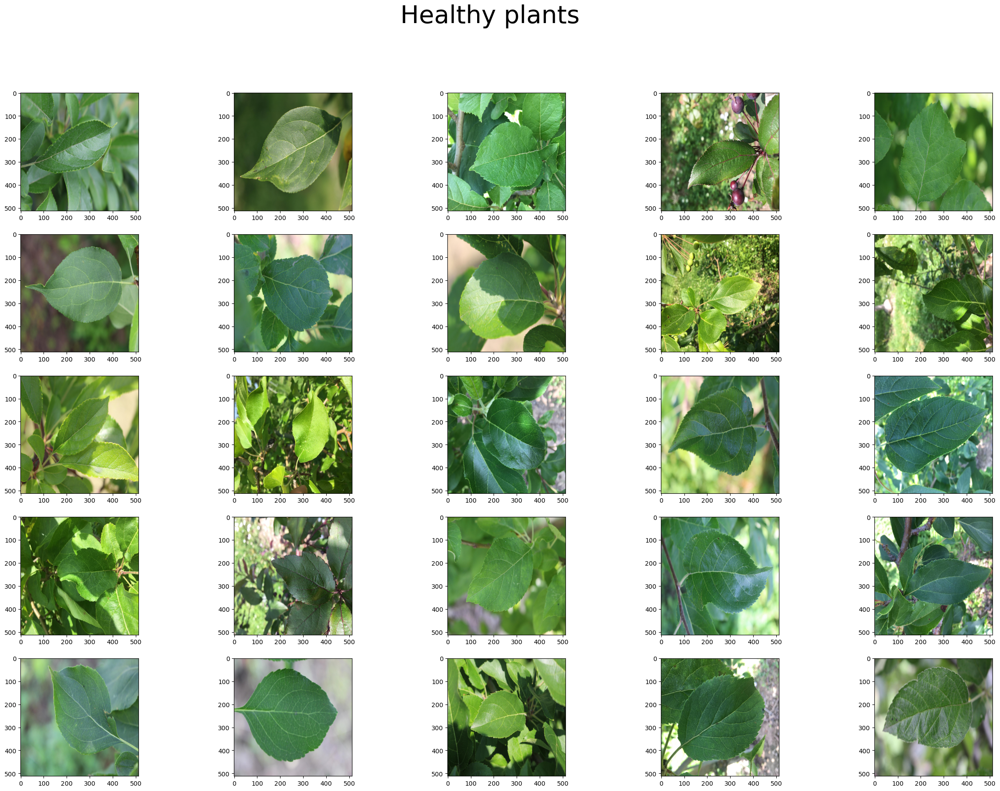

In [3]:
def load_image(image_id):
    img_path = "../input/plant-pathology-2020-fgvc7/images/"
    file_path = img_path + image_id + ".jpg"
    image = cv2.imread(file_path)
    image = cv2.resize(image, (512, 512))
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Get the image IDs from the train_pd DataFrame
train_image_ids = train_csv["image_id"][:]

# Load the images using the image IDs
train_images = train_image_ids.progress_apply(load_image)

data = train_csv.loc[100:300]
data = data.query("healthy == {}".format(1)) # https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.query.html and https://www.w3schools.com/python/ref_string_format.asp
images = train_images.loc[list(data.index)]
cols, rows = 5, min([5, len(images)//5])
    
fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(30, rows*20/5))
for col in range(cols):
    for row in range(rows):
        ax[row, col].imshow(images.loc[images.index[row*5+col]])
plt.suptitle('Healthy plants', fontsize = 40)
plt.show()

As we can see, the leafs are green and look like there are no particular deterioration, next we will see respectively leafs with the label "scab", "rust" and finally "multiple diseases"

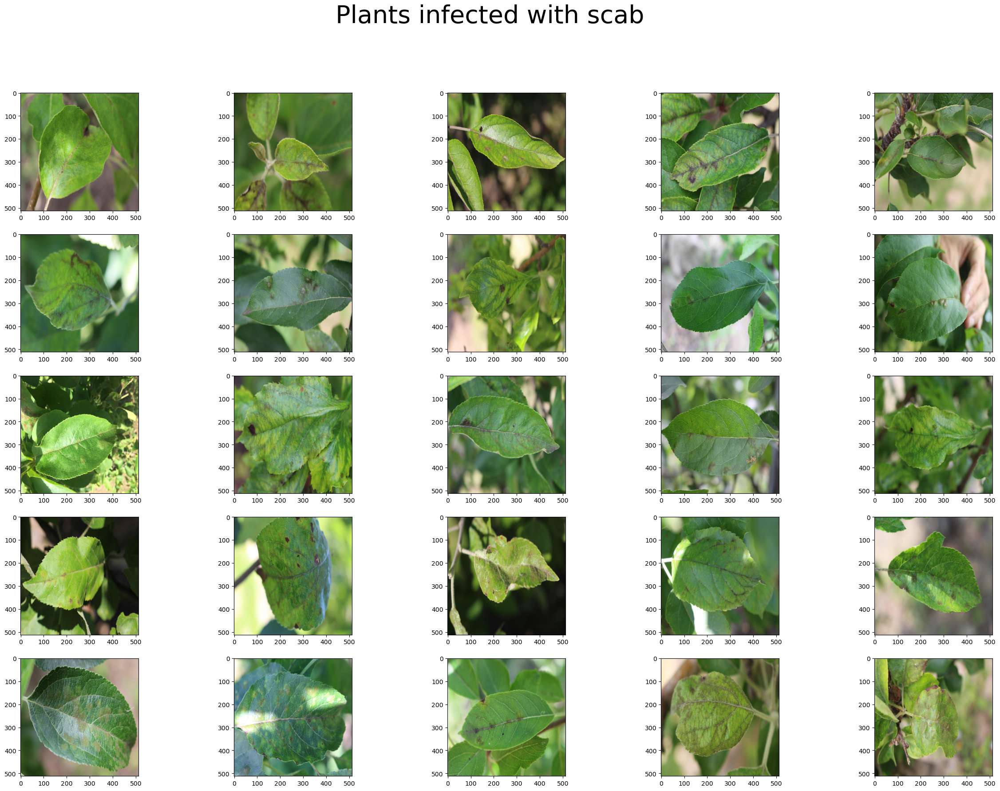

In [4]:
data = train_csv.loc[100:300]
data = data.query("scab == {}".format(1)) # https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.query.html and https://www.w3schools.com/python/ref_string_format.asp
images = train_images.loc[list(data.index)]
cols, rows = 5, min([5, len(images)//5])
    
fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(30, rows*20/5))
for col in range(cols):
    for row in range(rows):
        ax[row, col].imshow(images.loc[images.index[row*5+col]])
plt.suptitle('Plants infected with scab', fontsize = 40)
plt.show()

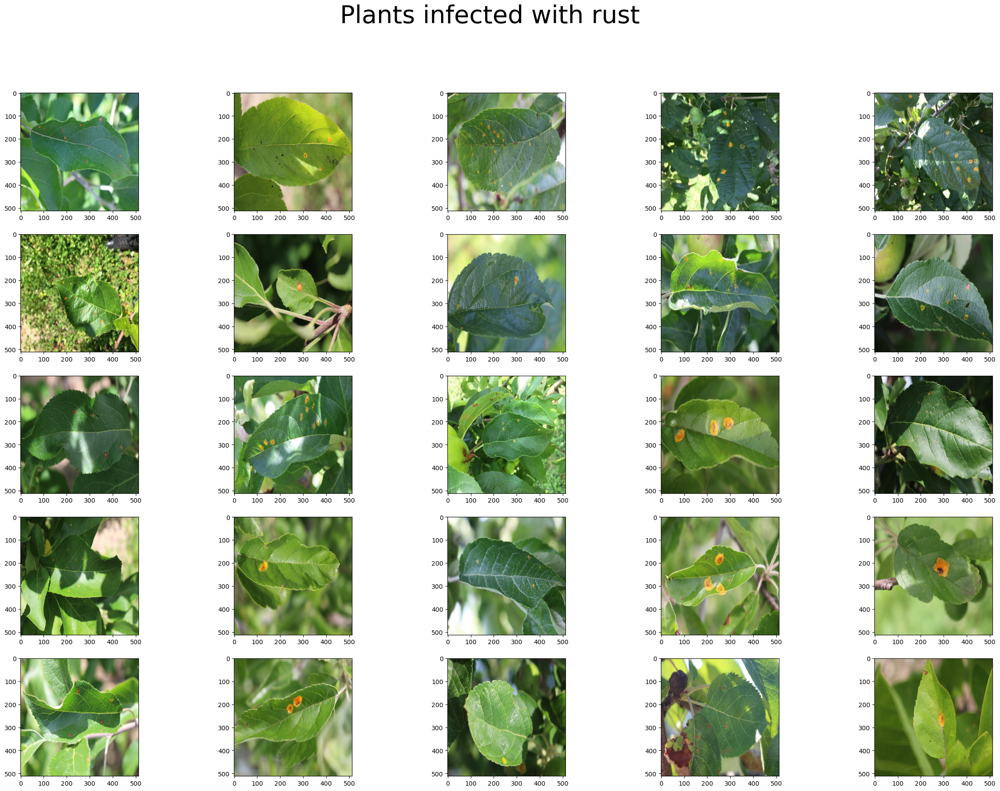

In [5]:
data = train_csv.loc[100:300]
data = data.query("rust == {}".format(1)) # https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.query.html and https://www.w3schools.com/python/ref_string_format.asp
images = train_images.loc[list(data.index)]
cols, rows = 5, min([5, len(images)//5])
    
fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(30, rows*20/5))
for col in range(cols):
    for row in range(rows):
        ax[row, col].imshow(images.loc[images.index[row*5+col]])
plt.suptitle('Plants infected with rust', fontsize = 40)
plt.show()

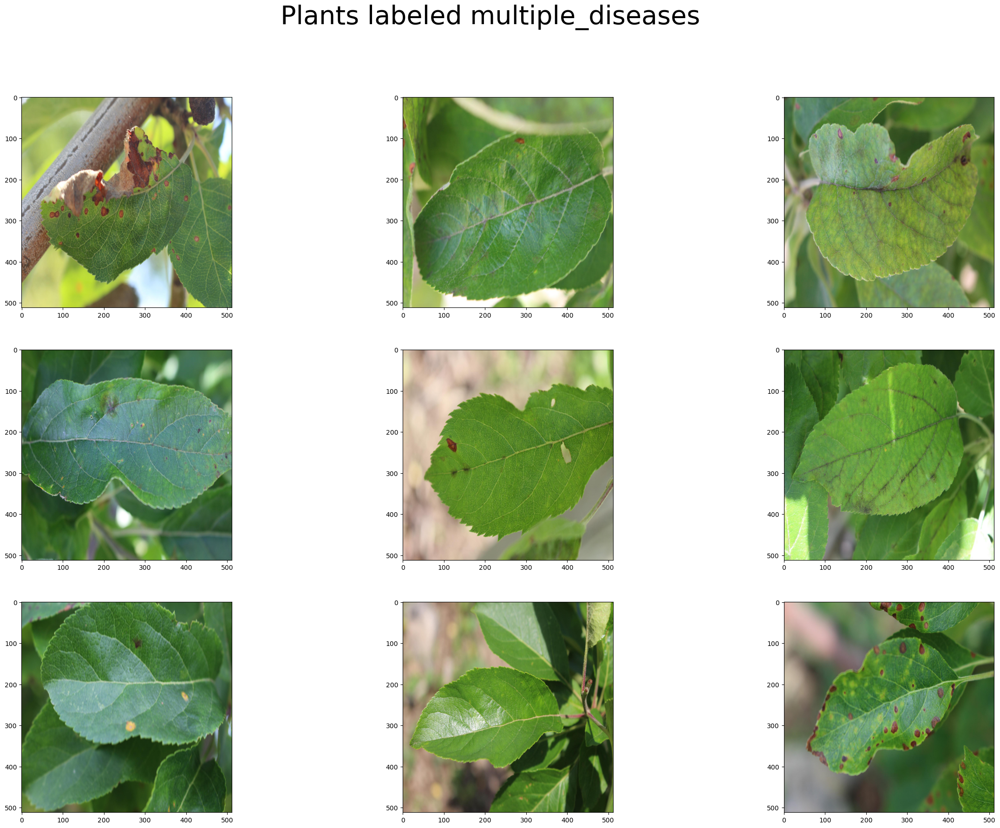

In [6]:
data = train_csv.loc[:]
data = data.query("multiple_diseases == {}".format(1)) # https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.query.html and https://www.w3schools.com/python/ref_string_format.asp
images = train_images.loc[list(data.index)]
cols, rows = 3, min([3, len(images)//3])
    
fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(30, rows*20/3))
for col in range(cols):
    for row in range(rows):
        ax[row, col].imshow(images.loc[images.index[row*3+col]])
plt.suptitle('Plants labeled multiple_diseases', fontsize = 40)
plt.show()

We can notice that for the multiple_diseases, we have sometimes very damaged plant like the first picture but also plants that look quite healthy at first glance like the eights picture here.

#### Finally let's see if the data is balanced

In [7]:
train_pd_copy = train_csv.copy()
train_pd_copy["Healthy"] = train_pd_copy["healthy"].apply(bool).apply(str)
fig = px.histogram(train_pd_copy, x="Healthy", title="Healthy distribution", color="Healthy",\
            color_discrete_map={
                "True": px.colors.qualitative.Plotly[0],
                "False": px.colors.qualitative.Plotly[1]})
fig


We can see that there are more infected plants than healthy, however, since there are 3 different classifications for infected and only 1 for healthy, it is actually a pretty good sign that the data can be balanced. Next, we will simply check the distribution.

In [8]:
fig = go.Figure([go.Pie(labels=train_csv.columns[1:], 
           values=train_csv.iloc[:, 1:].sum().values)])
fig

We can see that the data is mostly composed of "healthy", "scab" and "rust" and almost no "multiple_diseases". Only 5% is labeled "multiple_diseases", which means I may face an issue with this particular label. The data is imbalanced and might require data augmentation. 

Now that we have seen what the data looks like, we can move on to the methodology.

## Methodology

My first thought was to make my own model from scratch and using DataLoader for Pytorch since I have seen it in other works before and while researching. However, I was not able to make it work, I always had issues with a KeyError, maybe during the suffle part and all the indexing went wrong or just my implementation was flawed. If you are interested in looking at what I was trying to do, some attempts of code which are not functionning will be at the very end of this Notebook. 

After hours of trying with DataLoader, I had to make the hard decision that I was stuck and needed to do things differently. I looked into some already existing models with lots of documentation and help offered online. You can actually take a look at different models directly on Kaggle. I decided to go with DenseNet121, since it is recognized as a very good model and was used in medical imagery in the past. Following is a picture of the DenseNet architecture, it is quite big and complex but all of its layer is the one used on most convolutional neural networks. This combination of layers and the weights already predefined thanks to the images for Imagenet and thorough training makes this model very interesting to use, even on new datasets. (If you don't have the jpg of the picture in your files, it will not show here if you run the notebook again, however you have the link to the blog the picture is from below)

References:

DataLoader (Link: https://pytorch.org/tutorials/beginner/basics/data_tutorial.html)

DenseNet (Link: https://pytorch.org/hub/pytorch_vision_densenet/)↩

DenseNet image (Link:https://www.researchgate.net/figure/The-architecture-of-DenseNet121-with-Dense-block-D-Transition-blocks-T-and-Dense_fig3_358042365) ↩

Imagenet (Link: https://www.image-net.org/)



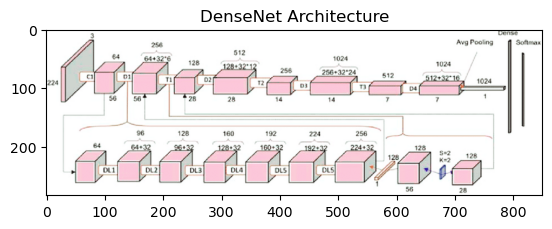

In [12]:
img_dense = cv2.imread("../input/densenet121/DenseNet.png")
plt.title("DenseNet Architecture")
plt.imshow(img_dense)

#### First, I load all the images and label into arrays so I can use and split them later on.

In [13]:
train_csv = pd.read_csv("../input/plant-pathology-2020-fgvc7/train.csv")
images_path = pathlib.Path("../input/plant-pathology-2020-fgvc7/images/")
list_images = list(images_path.glob("*.*"))
print(len(list_images))

images_id = train_csv['image_id']
healthy = train_csv['healthy']
multiple_diseases = train_csv['multiple_diseases']
rust = train_csv['rust']
scab = train_csv['scab']
images = []
labels = []
for index, values in enumerate(images_id):
    img = cv2.imread(os.path.join( "../input/plant-pathology-2020-fgvc7/images/", "{}.jpg".format(values)))
    img = cv2.resize(img, (128, 128))
    img = img/255
    labels.append([healthy[index], multiple_diseases[index], rust[index],
                 scab[index]])
    images.append(img)

3642


#### Here, I use keras ImageDataGenerator to augment the data set, with only simple vertical flip, horizontal flip and small rotations

In [14]:
img_generator = tf.keras.preprocessing.image.ImageDataGenerator(
        rotation_range=0.35,
        vertical_flip=True,
        horizontal_flip= True,
)
images_augmented = []
labels_augmented = []
for index, image in enumerate(images):
  for i in range(3):
      img = img_generator.flow(np.reshape(image, (1, 128, 128, 3))).next()
      images_augmented.append(np.reshape(img, (128, 128, 3)))
      labels_augmented.append(labels[index])
labels = np.asarray(labels_augmented)
images = np.asarray(images_augmented)


In [15]:
print(images.shape)

(5463, 128, 128, 3)


#### The augmentation makes me go from 1821 images for training to 5463 (3 times the original size) which is a pretty big improvement !

#### Then I upload the Densenet model through tensorflow keras, which is pretty simple

In [16]:
d = tf.keras.applications.DenseNet121(include_top=False,
                   input_shape=(128,128,3),
                   pooling=None,
                   weights='imagenet')
for i in d.layers:  #In order to train each layers
  i.trainable = True

29084464/29084464 [==============================] - 0s 0us/step


#### Once it is done, I create the model, it will be using DenseNet first, which is usually used for imagenet which is a dataset of over 14 millions images. Since DenseNet can label 1,000 classes but we only want 4, we add some layers at the end. We use dropout to avoid overfitting and to make it closer to how our neurons actually work.

In [17]:
output_avg = tf.keras.layers.GlobalAveragePooling2D()(d.output)
output_max = tf.keras.layers.GlobalMaxPooling2D()(d.output)
x = tf.keras.layers.minimum([output_avg, output_max])
x = tf.keras.layers.Dropout(0.5)(x)
x = tf.keras.layers.Dense(256, activation = "gelu")(x) # Using relu instead gives around the same accuracy but I got my best score with gelu
x = tf.keras.layers.Dropout(0.3)(x)
x = tf.keras.layers.Dense(128, activation = "gelu")(x)
x = tf.keras.layers.Dropout(0.15)(x)
x = tf.keras.layers.Dense(4, activation = "softmax")(x)
x = tf.keras.models.Model(inputs = d.input, outputs = x)

#### Then I compile the model, we can see it has many layers and more that 7 millions parameters so it is a very complex model. I use Adam as the optimizer because it appears to be currently the best (or one of the best) optimizer. I use categorical_crossentropy as the loss function since it allows multiple labeling and was the best I found when testing different loss functions. Finally, the metric is accuracy, which makes most sense in a labelling scenario and will be discussed later in the results

In [18]:
x.compile(optimizer = tf.keras.optimizers.Adam(0.001), 
          loss = "categorical_crossentropy", 
          metrics ="accuracy")

# resulting accuracy decreased, around 60% to 85% accuracy very fluctuating
# x.compile(optimizer = tf.keras.optimizers.Adam(0.001),  
#           loss = "mean_absolute_error", 
#           metrics ="accuracy")
x.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 134, 134, 3)  0          ['input_1[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 64, 64, 64)   9408        ['zero_padding2d[0][0]']         
                                                                                                  
 conv1/bn (BatchNormalization)  (None, 64, 64, 64)   256         ['conv1/conv[0][0]']         

#### In order to test our model we do not forget to split into training and validation data

In [19]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size = 0.2, random_state = 42)
print(x_train.shape, x_test.shape)

(4370, 128, 128, 3) (1093, 128, 128, 3)


#### Then we fit the model with our data, here I put 30 epochs but with early stopping, it will go end before reaching that point, once training is not making much change to our accuracy or loss. With GPU it only takes a few minutes, but on CPU it can take hours. Note also that the first epoch might take longer than the others.

In [20]:
history = x.fit(x_train, y_train, epochs = 30, batch_size = 32,
                callbacks = [
                    tf.keras.callbacks.ReduceLROnPlateau(monitor='loss', factor=0.1, mode = 'min',
                                                  patience= 1),
                    tf.keras.callbacks.EarlyStopping(monitor = 'loss', patience = 3, mode = 'min', restore_best_weights = True)
                ])

Epoch 1/30
137/137 [==============================] - 106s 158ms/step - loss: 0.7482 - accuracy: 0.7435 - lr: 0.0010
Epoch 2/30
137/137 [==============================] - 18s 131ms/step - loss: 0.3937 - accuracy: 0.8789 - lr: 0.0010
Epoch 3/30
137/137 [==============================] - 18s 135ms/step - loss: 0.2989 - accuracy: 0.9057 - lr: 0.0010
Epoch 4/30
137/137 [==============================] - 18s 132ms/step - loss: 0.2224 - accuracy: 0.9291 - lr: 0.0010
Epoch 5/30
137/137 [==============================] - 18s 132ms/step - loss: 0.1960 - accuracy: 0.9336 - lr: 0.0010
Epoch 6/30
137/137 [==============================] - 18s 132ms/step - loss: 0.1725 - accuracy: 0.9444 - lr: 0.0010
Epoch 7/30
137/137 [==============================] - 18s 134ms/step - loss: 0.1756 - accuracy: 0.9453 - lr: 0.0010
Epoch 8/30
137/137 [==============================] - 18s 133ms/step - loss: 0.0905 - accuracy: 0.9721 - lr: 1.0000e-04
Epoch 9/30
137/137 [==============================] - 18s 132ms/ste

#### Now, we visualize our model through the epochs, we can see it reaches a good accuracy quite fast

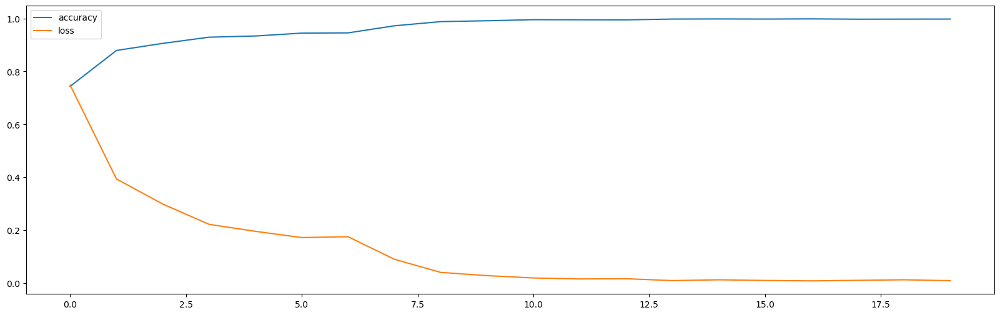

In [21]:
plt.figure(figsize = (20, 6))
plt.plot(history.history['accuracy'], label = "accuracy")
plt.plot(history.history['loss'], label = "loss")
plt.legend()

## Results

The results are calculated as accuracies, more exactly the number of correct labeling over total number of images. That way we can see how well our model performs overall. However, it is important to note that high accuracy is not always sufficient, if your dataset is imbalanced, you might get a very good accuracy just because the model always picks the most common output. This is something we want to verify.

#### We evaluate our model on our validation set (here called test) and we can see it is pretty accurate. But let's also take a closer look

In [22]:
x.evaluate(x_test, y_test, batch_size= 32)

35/35 [==============================] - 5s 73ms/step - loss: 0.1366 - accuracy: 0.9652


[0.13661403954029083, 0.965233325958252]

#### To have a better understanding of my result, I check if some specific labels are mislabelled or if our splitted dataset was really imbalanced, after, I will do a confusion matrix under the form of a heatmap.

In [23]:
y_pred = x.predict(x_test)
y_pred = np.argmax(y_pred, axis = 1)
y_test = np.argmax(y_test, axis = 1)
cnn_standard_acc = accuracy_score(y_pred, y_test)
print(cnn_standard_acc)

35/35 [==============================] - 3s 34ms/step
0.9652333028362305


In [24]:
print(classification_report(y_pred, y_test))

              precision    recall  f1-score   support

           0       0.96      0.97      0.96       302
           1       0.74      0.83      0.78        41
           2       0.99      0.98      0.99       395
           3       0.97      0.96      0.97       355

    accuracy                           0.97      1093
   macro avg       0.92      0.93      0.92      1093
weighted avg       0.97      0.97      0.97      1093



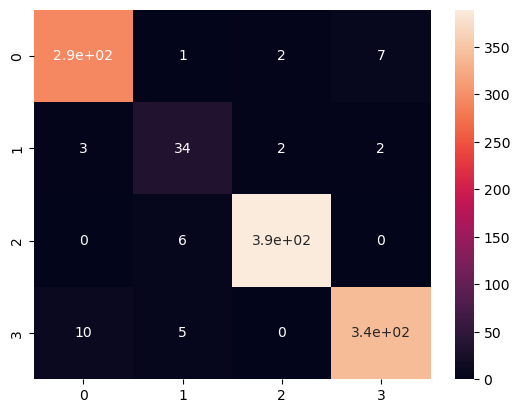

In [25]:
def generate_confusion_matrix(y_pred, y_test):
    c = tf.math.confusion_matrix(y_pred, y_test)
    sns.heatmap(c, annot=True)

generate_confusion_matrix(y_pred, y_test)

#### We can see from this confusion matrix that our model works fine ! However, we can see that the multiple_diseases has way less representation in our dataset but was still able to get recognized most of the time. The table above the confusion matrix is a great recap of our results. We can see that the support for multiple_diseases is 41 while the others are at more than 300. We have 1093 pictures in total in our dataset which is even a bit less than the 5% overall. The result you see will change each time you run it since the splitting is randomized. However, you should obtain similar results.

#### But now, we need to verify if our model also gives good predictions on useen data, that's when the test.csv comes into play. We use our model to get the predictions and upload the resulting submission to kaggle to get our results. For this particular run, the accuracy on kaggle was 0.93 which is very good !

In [26]:
test_csv = pd.read_csv("../input/plant-pathology-2020-fgvc7/test.csv")

images_id = test_csv['image_id']
images = []

for index, values in enumerate(images_id):
    img = cv2.imread(os.path.join( "../input/plant-pathology-2020-fgvc7/images/", "{}.jpg".format(values)))
    img = cv2.resize(img, (128, 128))
    img = img/255
    images.append(img)
    
images = np.asarray(images)

In [27]:
y_pred = x.predict(images)
y_sub = pd.DataFrame(y_pred)
print(y_sub[:5])

57/57 [==============================] - 4s 63ms/step
              0             1             2             3
0  7.684637e-05  1.009078e-03  9.987650e-01  1.490125e-04
1  8.008477e-09  2.204416e-07  9.999998e-01  1.912206e-08
2  4.752953e-09  5.267818e-07  3.121647e-11  9.999995e-01
3  9.999995e-01  4.760250e-08  1.861164e-07  3.012946e-07
4  6.902699e-09  1.010232e-07  9.999999e-01  9.067354e-09


In [28]:
submission = pd.concat([images_id, y_sub], axis=1)
submission.columns = ["image_id", "healthy", "multiple_diseases", "rust", "scab"]
print(submission.head())

  image_id       healthy  multiple_diseases          rust          scab
0   Test_0  7.684637e-05       1.009078e-03  9.987650e-01  1.490125e-04
1   Test_1  8.008477e-09       2.204416e-07  9.999998e-01  1.912206e-08
2   Test_2  4.752953e-09       5.267818e-07  3.121647e-11  9.999995e-01
3   Test_3  9.999995e-01       4.760250e-08  1.861164e-07  3.012946e-07
4   Test_4  6.902699e-09       1.010232e-07  9.999999e-01  9.067354e-09


In [30]:

submission_csv = submission.to_csv('sample_submission.csv', index=False)

### Discussion

There are some points that could be improved, more fine tuning and work on the layers out of DenseNet could potentially give better results. However, if we want to achieve as high as the top from the leaderboard, it might be necessary to change our model to a different one or even use multiple ones. I have seen a suggestion to use Random Forest after DenseNet and I am certain there are other ideas out there. 

Nevertheless, I am proud of my result, especially since I struggled so much in the beginning. I do have a few questions about the data augmentation. Was it correct to augment all the dataset, or should I have only augmented the data I was training on. I thought about it in the end, but it may increase the chance of overfitting if the image is similar and labeled and then put in the validation set. However, the model still performed well on the test set on Kaggle with results up to 0.935 accuracy while my goal was to reach over 0.90. I do not believe I could reach so high results without using pre-trained models such as DenseNet or ResNet. 

Finally, I found the project interesting and even more challenging than I expected. I am happy with my work and results.

## Thank you for reading !

#### Appendix (codes) 


<div class="alert alert-info" style="color:red">
The following codes are currently not working ! I was not able to use dataloader as I first wanted and make my own model from scratch. But if you want to take a look at it here it is.
</div>

In [ ]:
import pandas as pd
import numpy as np
import cv2
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from sklearn.model_selection import train_test_split

# Load the training data
train_df = pd.read_csv("train.csv")
img_path = "images/"


# Split the data into train and validation sets
train_indices, val_indices = train_test_split(train_df.index, test_size=0.2, random_state=42)

train_images = train_df.loc[train_indices, "image_id"]
train_labels = train_df.loc[train_indices, "healthy":].values

val_images = train_df.loc[val_indices, "image_id"]
val_labels = train_df.loc[val_indices, "healthy":].values

# Reset the indices of train_images and train_labels
train_images = train_images.reset_index(drop=True)
train_labels = pd.DataFrame(train_labels, index=train_images.index)

class PlantPathologyDataset(Dataset):
    def __init__(self, image_ids, labels, img_dir, transform=None):
        self.image_ids = image_ids
        self.labels = labels
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        image_id = self.image_ids[idx]
        file_path = self.img_dir + image_id + ".jpg"
        labels = self.labels[idx]
        image = cv2.imread(file_path)
        image = cv2.resize(image, (512, 512))
        #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        if self.transform:
            image = self.transform(image)

        return image, labels

        #For data augmentation, I'll see later
transform = transforms.Compose([
    transforms.ToTensor(),
])

# Create the training dataset
train_dataset = PlantPathologyDataset(train_images, train_labels, img_path, transform=transform)

# Create the validation dataset
val_dataset = PlantPathologyDataset(val_images, val_labels, img_path, transform=transform)

# Create the data loaders
batch_size = 8
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# i = 0
# for images, labels in train_loader:
#     try:
#         print(i)
#         i += 1
#     except Exception as e:
#         print(f"Error occurred at index {i}: {e}")

class MyModel(nn.Module):
    def __init__(self):
        super(MyModel, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=(8, 8), stride=(2, 2))
        self.act1 = nn.ReLU()
        self.flatten = nn.Flatten(start_dim=1, end_dim=-1)

        conv_output_size = ((512 - 8) // 2 + 1) ** 2 * 32
        self.fc = nn.Linear(conv_output_size, 4)

    def forward(self, x):
        x = self.conv1(x)
        x = self.act1(x)
        x = self.flatten(x)
        x = self.fc(x)
        return x

num_epochs = 5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = MyModel().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

for epoch in range(num_epochs):
    model.train()  # Set the model to training mode
    running_loss = 0.0

    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, torch.argmax(labels, dim=1))
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    epoch_loss = running_loss / len(train_loader)
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}")

    model.eval()  # Set the model to evaluation mode
total_correct = 0
total_samples = 0

with torch.no_grad():
    for images, labels in val_loader:
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)
        _, predicted = torch.max(outputs, dim=1)

        total_samples += labels.size(0)
        total_correct += (predicted == torch.argmax(labels, dim=1)).sum().item()

accuracy = total_correct / total_samples
print(f"Validation Accuracy: {accuracy * 100:.2f}%")

test_df = pd.read_csv("test.csv")
test_dataset = PlantPathologyDataset(test_df, img_path, transform=transform)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

model.eval()  # Set the model to evaluation mode
test_predictions = []

with torch.no_grad():
    for images, _ in test_loader:
        images = images.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, dim=1)
        test_predictions.extend(predicted.cpu().numpy())

test_df["predicted_label"] = test_predictions
test_df.to_csv("test_predictions.csv", index=False)

In [ ]:
import cv2
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
import tensorflow as tf

img_path = "images/"
train_path = "train.csv"
test_path = "test.csv"
sample_submission_path = "sample_submission.csv"

train_pd = pd.read_csv(train_path)
test_pd = pd.read_csv(test_path)
ss_pd = pd.read_csv(sample_submission_path)

def load_image(image_id):
    file_path = img_path + image_id + ".jpg"
    image = cv2.imread(file_path)
    image = cv2.resize(image, (512, 512))
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Get the image IDs from the train_pd DataFrame
train_image_ids = train_pd["image_id"][:]

# Load the images using the image IDs
train_images = train_image_ids.progress_apply(load_image)

# Define the labels (y_train)
labels = train_pd.loc[:, 'healthy':].values
y = torch.tensor(labels, dtype=torch.float32)  # Convert labels to tensors

class CustomDataset(Dataset):
    def __init__(self, images, labels):
        self.images = images
        self.labels = labels

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]
        return image, label

# Debug the load_image function
for image_id in train_image_ids[:5]:
    image = load_image(image_id)
    if image.shape!=(512, 512, 3):
        print(image_id)

# Check the length of the datasets
print(len(train_images))
print(len(y))

# Create train and validation datasets
X_train, X_val, y_train, y_val = train_test_split(train_images, y, test_size=0.15)

train_dataset = CustomDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_dataset = CustomDataset(X_val, y_val)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
